In [2]:
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import animation, colors
import seaborn as sns
from enum import IntEnum
import random
from tqdm import tqdm
import scipy
random.seed = 1337

In [3]:
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [4]:
class State(IntEnum):
    SUSCEPTIBLE = 1
    EXPOSED = 2
    INFECTIOUS = 3
    REMOVED = 4
    DEAD = 5

    def get_values():
        return list(map(int, State))
    
    def max_value():
        return State.get_values()[-1]

class Particle():
    def __init__(self, x, y, remove_tuple, latent_tuple):
        self.x = x
        self.y = y
        self.step = 0
        self.state = State.SUSCEPTIBLE

        self.remove_rate = 1/(np.random.uniform(remove_tuple[0], remove_tuple[1]))
        self.latent_rate = 1/(np.random.uniform(latent_tuple[0], latent_tuple[1]))
    
    def change_state(self, new_state):
        self.step = 0
        assert new_state in State.get_values(), f"Value {new_state} not found!"
        
        self.state = new_state
        

In [5]:
class Grid:
    def __init__(self, nx, ny, num_part, init_infected=1, 
                latent_tuple=(5.2, 3.7), remove_tuple=(2.9, 2.1), tp_chance=0, 
                infectious_radius=2, lockdown_at=0, lockdown_dur=0):

        self.x_size = nx
        self.y_size = ny
        self.clear_grid()
        print("Grid shape",self.grid.shape)
        self.particles = np.zeros(dtype=Particle, shape=(self.grid.shape))
        self.rad = infectious_radius
        self.tp_chance = tp_chance
        self.lock_a = lockdown_at
        self.lock_b = lockdown_at+lockdown_dur
        self.particle_count = num_part

        tries = 0
        population = 0
        for i in tqdm(range(num_part)):
            x = random.randint(0, nx-1)
            y = random.randint(0, ny-1)
            while (tries != num_part*2 and self.grid[x][y] != 0):
                x = random.randint(0, nx-1)
                y = random.randint(0, ny-1)
                tries += 1
            
            assert tries < num_part, "Grid full!"

            part = Particle(x, y, remove_tuple=remove_tuple, latent_tuple=latent_tuple)
            
            self.grid[x, y] = part.state
            self.particles[x, y] = part
            population += 1
        infected = 0
        for i in range(init_infected):
            p = int(0)
            while p == 0: 
                x = random.choice(list(range(0, self.x_size)))
                y = random.choice(list(range(0, self.y_size)))
                p = self.particles[x, y]
            p.change_state(State.INFECTIOUS)
            infected += 1

        print(f"Created {population} particles, {infected} infected")

    def clear_grid(self):
        self.grid = np.array(
                        np.zeros(self.x_size*self.y_size).
                            reshape((self.x_size, self.y_size))
                    )
    
    def update_infection(self, i):
        self.clear_grid()

        #travel sim
        lockdown_reducer = 1
        if self.lock_a <= i <= self.lock_b:
            lockdown_reducer = 0.05
        for i in range(int(self.tp_chance*self.particle_count*lockdown_reducer)):
            p = int(0)
            while p == 0 or p == self: 
                x = random.choice(list(range(0, self.x_size)))
                y = random.choice(list(range(0, self.y_size)))
                p = self.particles[x, y]
            new_x = p.x
            new_y = p.y
            old_x = p.x
            old_y = p.y
            while self.particles[new_x, new_y] != 0:
                new_x = random.randint(0, self.x_size-1)
                new_y = random.randint(0, self.y_size-1)
            p.x = new_x
            p.y = new_y
            self.particles[old_x, old_y] = 0
            self.particles[new_x, new_y] = p
                        

        for p_i in range(len(self.particles)):
            for p_j in range(len(self.particles[p_i])):
                p = self.particles[p_i, p_j]
                if p == 0: continue

                p.step += 1
                match p.state:
                    case State.INFECTIOUS:
                        # spread the disease to others
                        for xi in range(p.x-self.rad, p.x+self.rad+1):
                            for yi in range(p.y-self.rad, p.y+self.rad+1):
                                if not (xi == p.x and yi == p.y) and \
                                     xi < self.x_size and yi < self.y_size:
                                     
                                    # if the new particle is susceptible, infect with prob i_c
                                    if self.particles[xi, yi] != 0 and \
                                        self.particles[xi, yi].state == State.SUSCEPTIBLE:
                                            
                                        self.grid[xi,yi] = State.EXPOSED
                                        self.particles[xi, yi].change_state(State.EXPOSED)

                        # recover or die D:
                        if p.step * p.remove_rate >= 1: # fully recovered
                            p.change_state(State.REMOVED)
                        else:
                            # still recovering
                            pass
                    
                    case State.EXPOSED:
                        # advance disease
                        if p.step * p.latent_rate >= 1:
                            p.change_state(State.INFECTIOUS)
                        else:
                            # disease still latent
                            pass
                
                self.grid[p.x,p.y] = p.state


Grid shape (600, 600)


100%|██████████| 10000/10000 [00:00<00:00, 146355.13it/s]


Created 10000 particles, 1 infected


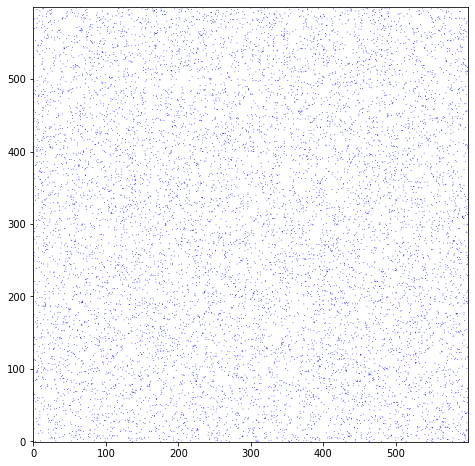

In [12]:
nrows = 600
ncols = 600
n_frames = 100
lock_a = 0
lock_dur = 0

g = Grid(nrows, ncols, num_part=10000, init_infected=1, infectious_radius=3, tp_chance=1,
            lockdown_at=lock_a, lockdown_dur=lock_dur)

history = []
fig, ax = plt.subplots(figsize=(8, 8))

# optionally add grid
#ax.set_xticks(np.arange(ncols+1)-0.5, minor=True)
#ax.set_yticks(np.arange(nrows+1)-0.5, minor=True)
#ax.grid(which="minor")
#ax.tick_params(which="minor", size=0)

plt.ion()  
color_list = ["white","blue","violet","red","green","black"]
cmap = colors.LinearSegmentedColormap.from_list("", color_list)
im = ax.imshow(g.grid, origin="lower", vmin=0, vmax=State.max_value(),cmap=cmap)

def init():
    im.set_data(np.zeros((nrows, ncols)))
    make_simulation()

def animate(i):
    im.set_data(history[i])
    return im

def make_simulation():
    print("Simulating...")
    for i in tqdm(range(n_frames)):
        g.update_infection(i)
        history.append(g.grid)


anim = animation.FuncAnimation(fig, animate, init_func=init, 
                                frames=tqdm(range(n_frames)), interval=90)

In [13]:
HTML(anim.to_jshtml())

Simulating...



0it [00:00, ?it/s]


In [14]:
sus_count=[]; exposed_count=[]; infectious_count=[]; recovered_count=[]; dead_count=[]
for snapshot in history:
    sus_count.append( snapshot[snapshot==State.SUSCEPTIBLE].size )
    exposed_count.append(  snapshot[snapshot==State.EXPOSED].size )
    infectious_count.append(  snapshot[snapshot==State.INFECTIOUS].size )
    recovered_count.append(  snapshot[snapshot==State.REMOVED].size )
    dead_count.append( snapshot[snapshot==State.DEAD].size )

print("Susceptible people beginning: ", history[0][history[0]==State.SUSCEPTIBLE].size)
print("Infected people beginning: ", history[0][history[0]==State.INFECTIOUS].size)
print(f"Particles beginning {history[0][history[0]!=0].size} and end {history[0][history[0]!=0].size}")

Susceptible people beginning:  9998
Infected people beginning:  1
Particles beginning 10000 and end 10000


In [15]:
simulation = pd.DataFrame({"susceptible":sus_count, "exposed":exposed_count, 
                "infectious":infectious_count, "removed":recovered_count})

<AxesSubplot:>

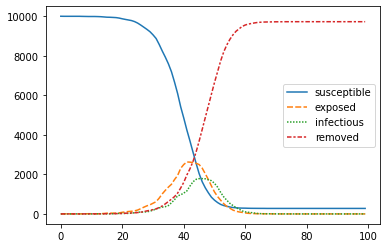

In [16]:
sns.lineplot(data=simulation)
#plt.axvline(lock_a)
#plt.axvline(lock_a+lock_dur)

In [11]:
color_list

['white', 'blue', 'violet', 'red', 'green', 'black']

 99%|█████████▉| 99/100 [00:39<00:00, 12.27it/s]